In [1]:
import pandas as pd
from bertopic import BERTopic
import nltk
import re
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt

In [2]:
vectorizer_model = CountVectorizer(stop_words="english")
topic_model = BERTopic(vectorizer_model=vectorizer_model)

# read data
df = pd.read_csv('../data/wps_speeches.csv')

In [3]:
df['only text'] = df['only text'].astype(str)
docs = df['only text'].tolist()
years = df['year'].tolist()

In [4]:
docs_beginning = df[df['year'].isin([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009])]['only text'].tolist()
docs_end = df[df['year'].isin([2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019])]['only text'].tolist()

In [5]:
# get topics and probs
topics, probs = topic_model.fit_transform(docs)

In [6]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,773,-1_women_violence_sexual_security,"[women, violence, sexual, security, peace, con...","[ Nigeria welcomes you, Mr. President, to the ..."
1,0,264,0_women_gender_peace_peacekeeping,"[women, gender, peace, peacekeeping, resolutio...",[ I am very pleased to be able to brief the Co...
2,1,177,1_trafficking_human_persons_crime,"[trafficking, human, persons, crime, slavery, ...",[ Let me first thank the United Kingdom presid...
3,2,109,2_sexual_violence_conflict_united,"[sexual, violence, conflict, united, council, ...",[ New Zealand wishes to express its appreciati...
4,3,57,3_asean_indonesia_malaysia_women,"[asean, indonesia, malaysia, women, violence, ...",[ I have the honour to speak on behalf of the ...
5,4,49,4_sexual_violence_european_conflict,"[sexual, violence, european, conflict, conflic...","[ The candidate countries Turkey, Croatia, the..."
6,5,47,5_african_union_sahel_africa,"[african, union, sahel, africa, region, joint,...","[ At the outset, I wish to congratulate the de..."
7,6,42,6_abuse_exploitation_peacekeeping_allegations,"[abuse, exploitation, peacekeeping, allegation...","[ Thank you, Mr. President, for the opportunit..."
8,7,41,7_sexual_violence_victims_crimes,"[sexual, violence, victims, crimes, uruguay, c...","[ At the outset, I would like to express my gr..."
9,8,39,8_women_peace_security_france,"[women, peace, security, france, agenda, women...",[ I thank the French presidency for putting th...


In [7]:
topic_model.visualize_topics()

In [8]:
# reduce topics (from 58 to 10)
topic_model.reduce_topics(docs, nr_topics=10)

# Access updated topics
topics = topic_model.topics_
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,773,-1_women_violence_sexual_security,"[women, violence, sexual, security, peace, con...",[ I have the honour to speak on behalf of the ...
1,0,1047,0_women_peace_security_resolution,"[women, peace, security, resolution, conflict,...",[ I thank the Security Council for the invitat...
2,1,351,1_sexual_violence_conflict_united,"[sexual, violence, conflict, united, women, na...","[ Allow me to begin by thanking you, Mr. Presi..."
3,2,177,2_trafficking_human_persons_crime,"[trafficking, human, persons, crime, victims, ...",[ Ijoin the previous speakers in commending yo...
4,3,87,3_peacebuilding_african_peace_women,"[peacebuilding, african, peace, women, securit...","[ Madam President, China welcomes the fact tha..."
5,4,59,4_women_ukraine_security_rights,"[women, ukraine, security, rights, conflict, p...",[ I would like to begin by commending the pres...
6,5,26,5_sexual_syrian_violence_syria,"[sexual, syrian, violence, syria, women, crime...",[ Syria stresses the importance of the item un...
7,6,22,6_violence_sexual_armed_venezuela,"[violence, sexual, armed, venezuela, women, co...",[ Costa Rica wishes to thank the Uruguayan pre...
8,7,13,7_women_displaced_refugees_girls,"[women, displaced, refugees, girls, displaceme...",[ We welcome the Argentine presidency's conven...
9,8,11,8_afghanistan_afghan_women_womens,"[afghanistan, afghan, women, womens, rights, t...","[ At the outset, I would like to thank the Uni..."


In [9]:
topic_model.visualize_topics()

In [10]:
topic_dfs = {}

for topic in set(topic_model.topics_):
    topic_docs = [doc for doc, t in zip(docs, topic_model.topics_) if t == topic]
    topic_dfs[f"topic_{topic}"] = pd.DataFrame({"Document": topic_docs, "Topic": topic})

In [11]:
topic_dfs["topic_3"]

,Document,Topic
0,"My name is Helene Dandi Lou, from Cote d'Ivoi...",3
1,"I too am grateful to you, Mr. President, and ...",3
2,The presence of Minister Osei-Adjei among us ...,3
3,"Mr. President, on behalf of the African Union...",3
4,One of the most difficult and important tasks...,3
...,...,...
82,I would like to begin by congratulating the U...,3
83,I want to pay tribute to Ambassador Matjila. ...,3
84,I would like to begin by welcoming you to the...,3
85,"At the outset, I would like to congratulate t...",3


In [12]:
topic_dfs["topic_6"]

,Document,Topic
0,I would like to start by thanking the Preside...,6
1,It is an honour for Costa Rica to speak today...,6
2,"Madam President, Costa Rica recognizes your p...",6
3,May I begin by congratulating your delegation...,6
4,"I should like to congratulate you, Sir, on yo...",6
5,On behalf of the Bolivarian Republic of Venez...,6
6,Costa Rica thanks the Chilean for having conv...,6
7,"We wish to thank you, Madam, for convening th...",6
8,Costa Rica thanks the presidency of Jordan fo...,6
9,We welcome the convening of today's meeting a...,6


In [13]:
def create_wordcloud(model, topic):
    text = {word: value for word, value in model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()


In [14]:
topics_over_time = topic_model.topics_over_time(docs, years)
topic_model.visualize_topics_over_time(topics_over_time, topics=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [15]:
topic_dfs = {}

for topic in set(topic_model.topics_):
    topic_docs = [doc for doc, t in zip(docs, topic_model.topics_) if t == topic]
    topic_dfs[f"topic_{topic}"] = pd.DataFrame({"Document": topic_docs, "Topic": topic})

topic_dfs["topic_6"]

,Document,Topic
0,I would like to start by thanking the Preside...,6
1,It is an honour for Costa Rica to speak today...,6
2,"Madam President, Costa Rica recognizes your p...",6
3,May I begin by congratulating your delegation...,6
4,"I should like to congratulate you, Sir, on yo...",6
5,On behalf of the Bolivarian Republic of Venez...,6
6,Costa Rica thanks the Chilean for having conv...,6
7,"We wish to thank you, Madam, for convening th...",6
8,Costa Rica thanks the presidency of Jordan fo...,6
9,We welcome the convening of today's meeting a...,6


In [79]:
## CHINA, DOES NOT WORK (TOO LITTLE DATA?? ONLY EVER TWO TOPICS)

In [80]:
vectorizer_model = CountVectorizer(stop_words="english")
topic_model = BERTopic(vectorizer_model=vectorizer_model)

# read data
df = pd.read_csv('../data/wps_speeches.csv')
df['only text'] = df['only text'].astype(str)
china_df = df[df['country/organization'] == 'China']
china_docs = china_df['only text'].tolist()
years = china_df['year'].tolist()

# get topics and probs
topics, probs = topic_model.fit_transform(china_docs)
#topic_model.reduce_topics(china_docs, nr_topics=10)

# Access updated topics
#topics = topic_model.topics_
topic_model.get_topic_info()
#topic_model.visualize_topics()
topics_over_time = topic_model.topics_over_time(china_docs, years)
topic_model.visualize_topics_over_time(topics_over_time)

len(china_docs)

47

In [81]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,13,-1_women_countries_security_peace,"[women, countries, security, peace, internatio...",[ China welcomes the initiative of Chile in ho...
1,0,19,0_women_security_peace_international,"[women, security, peace, international, counci...",[ The Chinese delegation welcomes Argentina's ...
2,1,15,1_sexual_violence_conflict_international,"[sexual, violence, conflict, international, wo...",[ The Chinese delegation wishes to thank Niger...


In [82]:
## DOCS 2000 vs. 2019

In [83]:
## 2000
topics, probs = topic_model.fit_transform(docs_beginning)

In [84]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,39,-1_women_security_resolution_conflict,"[women, security, resolution, conflict, violen...","[ First of all, the Philippines commends and c..."
1,0,318,0_women_peace_security_resolution,"[women, peace, security, resolution, gender, c...","[ My delegation is grateful to you, Mr. Presid..."
2,1,99,1_violence_sexual_women_united,"[violence, sexual, women, united, conflict, co...","[ I would first like to thank you, Sir, and th..."
3,2,62,2_women_resolution_gender_1325,"[women, resolution, gender, 1325, 2000, europe...",[ It is a great honour for me to address the S...
4,3,29,3_women_pacific_resolution_peace,"[women, pacific, resolution, peace, new, secur...","[ May I congratulate you, Mr. President, on ta..."
5,4,22,4_abuse_exploitation_peacekeeping_sexual,"[abuse, exploitation, peacekeeping, sexual, op...",[ I would like to join others in underlining t...
6,5,21,5_women_peace_security_conflict,"[women, peace, security, conflict, participati...","[ I wish to thank Ms. Rice, Secretary of State..."
7,6,19,6_women_resolution_2009_2000,"[women, resolution, 2009, 2000, 1325, council,...",[ We wish to join other delegations in commend...


In [85]:
topic_model.visualize_topics()

In [86]:
topic_model.reduce_topics(docs_beginning, nr_topics=5)

# Access updated topics
topics = topic_model.topics_
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,39,-1_women_security_resolution_conflict,"[women, security, resolution, conflict, violen...","[ Thank you, Sir, for convening today's import..."
1,0,430,0_women_peace_resolution_security,"[women, peace, resolution, security, gender, c...","[ Let me thank you, Mr. President, and the del..."
2,1,99,1_violence_sexual_women_united,"[violence, sexual, women, united, conflict, co...","[ I thank you, Mr. President, for convening th..."
3,2,22,2_abuse_exploitation_peacekeeping_sexual,"[abuse, exploitation, peacekeeping, sexual, op...",[ I would like to join others in underlining t...
4,3,19,3_women_resolution_2000_1325,"[women, resolution, 2000, 1325, council, 2009,...",[ We wish to join other delegations in commend...


In [87]:
topic_model.visualize_topics()

In [88]:
# 2019
topics, probs = topic_model.fit_transform(docs_end)

In [89]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,656,-1_women_violence_security_peace,"[women, violence, security, peace, sexual, con...","[ First, I would like to say how happy, deligh..."
1,0,633,0_women_peace_security_united,"[women, peace, security, united, nations, reso...",[ I would join the Deputy Secretary- General a...
2,1,440,1_sexual_violence_conflict_women,"[sexual, violence, conflict, women, security, ...","[ At the outset, I would like to thank you, Ma..."
3,2,175,2_trafficking_human_persons_international,"[trafficking, human, persons, international, c...",[ I would like to thank the Spanish presidency...
4,3,53,3_women_ukraine_security_rights,"[women, ukraine, security, rights, peace, viol...",[ Ukraine associates itself with the statement...


In [90]:
topic_model.visualize_topics()

In [91]:
# WOMEN vs. MEN

In [89]:
# Men mentioned
men_boys_keywords = r"\b(men|man|boy|boys|male)\b"
# Women mentioned
women_girls_keywords = r"\b(women|woman|girl|girls|female)\b"

def filter_sentences(text, keyword_pattern):
    '''get sentences with keyword pattern (men or women)'''
    sentences = nltk.sent_tokenize(text)
    matching_sentences = [sentence for sentence in sentences if re.search(keyword_pattern, sentence, re.IGNORECASE)]

    return matching_sentences

def filter_sentences_only(text, keyword_pattern, exclude_pattern=None):
    '''get sentences with exclusive keyword pattern (e.g, "women" occurs in sentence but not "men")'''
    sentences = nltk.sent_tokenize(text)
    if exclude_pattern:
        matching_sentences = [sentence for sentence in sentences if re.search(keyword_pattern, sentence, re.IGNORECASE) and not re.search(exclude_pattern, sentence, re.IGNORECASE)]
    else:
        matching_sentences = [sentence for sentence in sentences if re.search(keyword_pattern, sentence, re.IGNORECASE)]
    return matching_sentences

def filter_text(df, keyword_pattern):
    filtered_rows = []
    df['only text'] = df['only text'].astype(str)
    for _, row in df.iterrows():
        matching_sentences = filter_sentences(row['only text'], keyword_pattern)

        for sentence in matching_sentences:
            new_row = row.copy()
            new_row['sentence'] = sentence
            filtered_rows.append(new_row)

    return pd.DataFrame(filtered_rows)

def filter_text_only(df, keyword_pattern, exclude_pattern=None):
    filtered_rows = []
    df['only text'] = df['only text'].astype(str)
    for _, row in df.iterrows():
        matching_sentences = filter_sentences_only(row['only text'], keyword_pattern, exclude_pattern)

        for sentence in matching_sentences:
            new_row = row.copy()
            new_row['sentence'] = sentence
            filtered_rows.append(new_row)

    return pd.DataFrame(filtered_rows)

df_men_boys_sentences = filter_text(df, men_boys_keywords)
df_women_girls_sentences = filter_text(df, women_girls_keywords)
df_men_boys_sentences_only = filter_text_only(df, men_boys_keywords, exclude_pattern=women_girls_keywords)
df_women_girls_sentences_only = filter_text_only(df, women_girls_keywords, exclude_pattern=men_boys_keywords)

In [90]:
# Men mentioned
men_keywords = r"\b(men|man|male)\b"
# Women mentioned
women_keywords = r"\b(women|woman|female)\b"

df_men_sentences = filter_text(df, men_keywords)
df_women_sentences = filter_text(df, women_keywords)
df_men_sentences_only = filter_text_only(df, men_keywords, exclude_pattern=women_keywords)
df_women_sentences_only = filter_text_only(df, women_keywords, exclude_pattern=men_keywords)


In [114]:
# Men mentioned
boys_keywords = r"\b(boy|boys)\b"
# Women mentioned
girls_keywords = r"\b(girl|girls)\b"

df_boys_sentences = filter_text(df, boys_keywords)
df_girls_sentences = filter_text(df, girls_keywords)
df_boys_sentences_only = filter_text_only(df, boys_keywords, exclude_pattern=girls_keywords)
df_girls_sentences_only = filter_text_only(df, girls_keywords, exclude_pattern=boys_keywords)

In [102]:
total_men_sentences = len(df_men_sentences)
men_with_women = total_men_sentences - len(df_men_sentences_only)
men_without_women = len(df_men_sentences_only)

men_with_women_percentage = (men_with_women / total_men_sentences) * 100
men_without_women_percentage = (men_without_women / total_men_sentences) * 100

total_women_sentences = len(df_women_sentences)
women_with_men = total_women_sentences - len(df_women_sentences_only)
women_without_men = len(df_women_sentences_only)

women_with_men_percentage = (women_with_men / total_women_sentences) * 100
women_without_men_percentage = (women_without_men / total_women_sentences) * 100

print(f"Amount of sentences with occurrence of 'men' or 'man': {total_men_sentences}")
print(f"Amount of sentences with occurrence of 'women' or 'woman': {total_women_sentences}")
print(f"Amount of sentences with occurrence of 'men, man' (no women mentioned): {men_without_women}")
print(f"Amount of sentences with occurrence of 'women, woman' (no men mentioned): {women_without_men}")
print(f"Percentage of sentences with men and women mentioned together (of men): {men_with_women_percentage:.2f}%")
print(f"Percentage of sentences with men mentioned without women: {men_without_women_percentage:.2f}%")
print(f"Percentage of sentences with women and men mentioned together (of women): {women_with_men_percentage:.2f}%")
print(f"Percentage of sentences with women mentioned without men: {women_without_men_percentage:.2f}%")

Amount of sentences with occurrence of 'men' or 'man': 1488
Amount of sentences with occurrence of 'women' or 'woman': 31791
Amount of sentences with occurrence of 'men, man' (no women mentioned): 313
Amount of sentences with occurrence of 'women, woman' (no men mentioned): 30616
Percentage of sentences with men and women mentioned together (of men): 78.97%
Percentage of sentences with men mentioned without women: 21.03%
Percentage of sentences with women and men mentioned together (of women): 3.70%
Percentage of sentences with women mentioned without men: 96.30%


In [57]:
total_boys_sentences = len(df_boys_sentences)
boys_with_girls = total_boys_sentences - len(df_boys_sentences_only)
boys_without_girls = len(df_boys_sentences_only)

boys_with_girls_percentage = (boys_with_girls / total_boys_sentences) * 100
boys_without_girls_percentage = (boys_without_girls / total_boys_sentences) * 100

total_girls_sentences = len(df_girls_sentences)
girls_with_boys = total_girls_sentences - len(df_girls_sentences_only)
girls_without_boys = len(df_girls_sentences_only)

girls_with_boys_percentage = (girls_with_boys / total_girls_sentences) * 100
girls_without_boys_percentage = (girls_without_boys / total_girls_sentences) * 100

# Print results
print(f"Amount of sentences with occurrence of 'boys' or 'boy': {total_boys_sentences}")
print(f"Amount of sentences with occurrence of 'girls' or 'girl': {total_girls_sentences}")
print(f"Amount of sentences with occurrence of 'boy, boys' (no girls mentioned): {boys_without_girls}")
print(f"Amount of sentences with occurrence of 'girl, girls' (no boys mentioned): {girls_without_boys}")
print(f"Percentage of sentences with boys and girls mentioned together (of boys): {boys_with_girls_percentage:.2f}%")
print(f"Percentage of sentences with boys mentioned without girls: {boys_without_girls_percentage:.2f}%")
print(f"Percentage of sentences with girls and boys mentioned together (of girls): {girls_with_boys_percentage:.2f}%")
print(f"Percentage of sentences with girls mentioned without boys: {girls_without_boys_percentage:.2f}%")


Amount of sentences with occurrence of 'boys' or 'boy': 379
Amount of sentences with occurrence of 'girls' or 'girl': 4518
Amount of sentences with occurrence of 'boy, boys' (no girls mentioned): 129
Amount of sentences with occurrence of 'girl, girls' (no boys mentioned): 4268
Percentage of sentences with boys and girls mentioned together (of boys): 65.96%
Percentage of sentences with boys mentioned without girls: 34.04%
Percentage of sentences with girls and boys mentioned together (of girls): 5.53%
Percentage of sentences with girls mentioned without boys: 94.47%


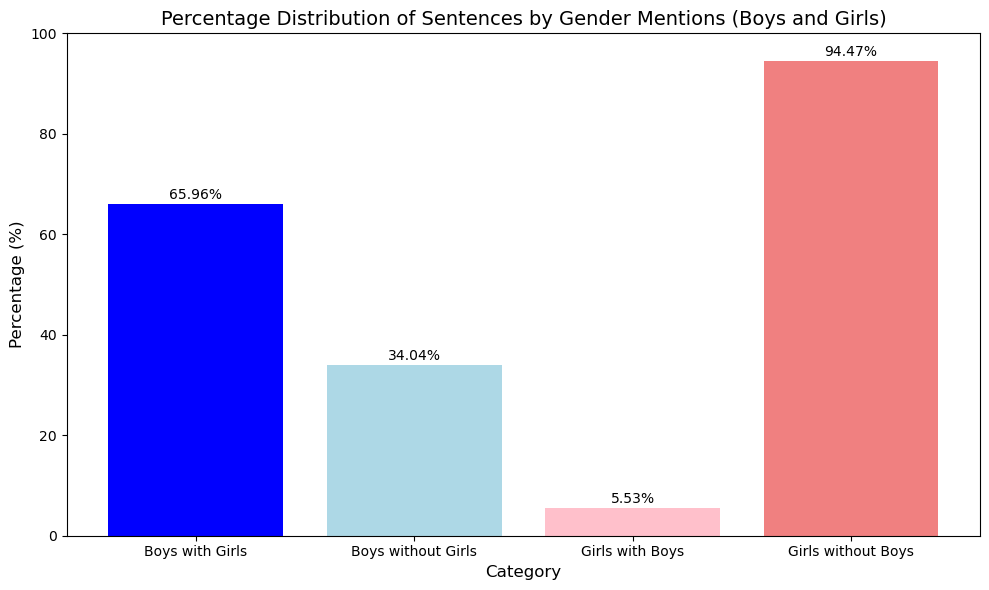

In [23]:
categories = ['Boys with Girls', 'Boys without Girls', 'Girls with Boys', 'Girls without Boys']
percentages = [
    boys_with_girls_percentage,
    boys_without_girls_percentage,
    girls_with_boys_percentage,
    girls_without_boys_percentage,
]

# Create a bar plot
plt.figure(figsize=(10, 6))
plt.bar(categories, percentages, color=['blue', 'lightblue', 'pink', 'lightcoral'])

# Add labels and title
plt.title('Percentage Distribution of Sentences by Gender Mentions (Boys and Girls)', fontsize=14)
plt.ylabel('Percentage (%)', fontsize=12)
plt.xlabel('Category', fontsize=12)
plt.ylim(0, 100)

# Add percentage labels on top of each bar
for i, value in enumerate(percentages):
    plt.text(i, value + 1, f"{value:.2f}%", ha='center', fontsize=10)

# Display the plot
plt.tight_layout()
plt.show()


In [24]:
total_men_boys_sentences = len(df_men_boys_sentences)
men_boys_with_women_girls = total_men_boys_sentences - len(df_men_boys_sentences_only)
men_boys_without_women_girls = len(df_men_boys_sentences_only)

men_boys_with_women_girls_percentage = (men_boys_with_women_girls / total_men_boys_sentences) * 100
men_boys_without_women_girls_percentage = (men_boys_without_women_girls / total_men_boys_sentences) * 100

total_women_girls_sentences = len(df_women_girls_sentences)
women_girls_with_men_boys = total_women_girls_sentences - len(df_women_girls_sentences_only)
women_girls_without_men_boys = len(df_women_girls_sentences_only)

women_girls_with_men_boys_percentage = (women_girls_with_men_boys / total_women_girls_sentences) * 100
women_girls_without_men_boys_percentage = (women_girls_without_men_boys / total_women_girls_sentences) * 100

print(f"Amount of sentences with occurrence of 'men, man, boy, or boys': {total_men_boys_sentences}")
print(f"Amount of sentences with occurrence of 'women, woman, girl, or girls': {total_women_girls_sentences}")
print(f"Amount of sentences with occurrence of 'men, man, boy, or boys' (no women/girls mentioned): {men_boys_without_women_girls}")
print(f"Amount of sentences with occurrence of 'women, woman, girl, or girls' (no men/boys mentioned): {women_girls_without_men_boys}")
print(f"Percentage of sentences with men/boys and women/girls mentioned together (of men/boys): {men_boys_with_women_girls_percentage:.2f}%")
print(f"Percentage of sentences with men/boys mentioned without women/girls: {men_boys_without_women_girls_percentage:.2f}%")
print(f"Percentage of sentences with women/girls and men/boys mentioned together (of women/girls): {women_girls_with_men_boys_percentage:.2f}%")
print(f"Percentage of sentences with women/girls mentioned without men/boys: {women_girls_without_men_boys_percentage:.2f}%")

Amount of sentences with occurrence of 'men, man, boy, or boys': 1428
Amount of sentences with occurrence of 'women, woman, girl, or girls': 31439
Amount of sentences with occurrence of 'men, man, boy, or boys' (no women/girls mentioned): 276
Amount of sentences with occurrence of 'women, woman, girl, or girls' (no men/boys mentioned): 30287
Percentage of sentences with men/boys and women/girls mentioned together (of men/boys): 80.67%
Percentage of sentences with men/boys mentioned without women/girls: 19.33%
Percentage of sentences with women/girls and men/boys mentioned together (of women/girls): 3.66%
Percentage of sentences with women/girls mentioned without men/boys: 96.34%


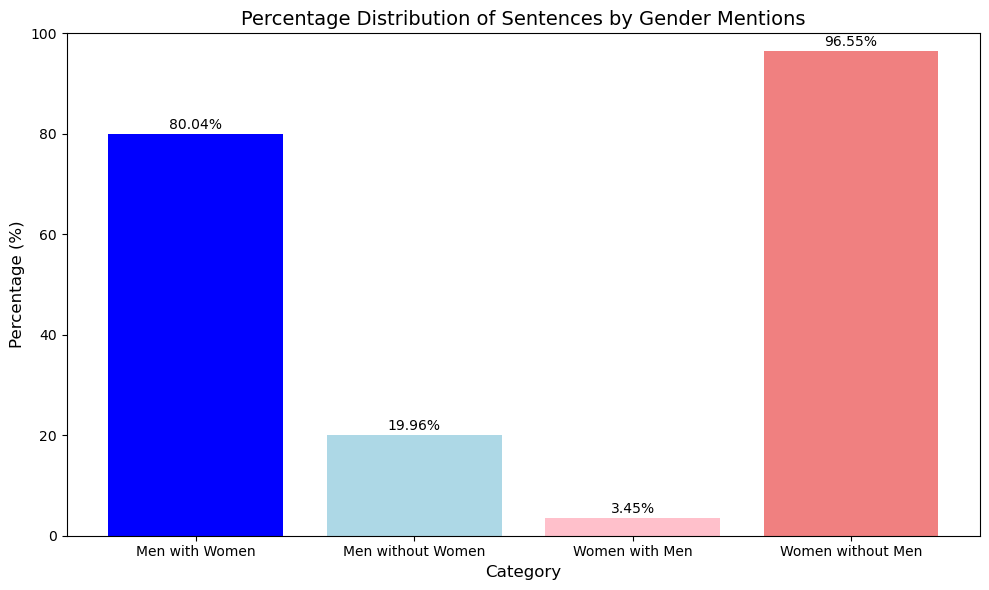

In [114]:
categories = ['Men with Women', 'Men without Women', 'Women with Men', 'Women without Men']
percentages = [
    men_with_women_percentage,
    men_without_women_percentage,
    women_with_men_percentage,
    women_without_men_percentage,
]

plt.figure(figsize=(10, 6))
plt.bar(categories, percentages, color=['blue', 'lightblue', 'pink', 'lightcoral'])

plt.title('Percentage Distribution of Sentences by Gender Mentions', fontsize=14)
plt.ylabel('Percentage (%)', fontsize=12)
plt.xlabel('Category', fontsize=12)
plt.ylim(0, 100)

for i, value in enumerate(percentages):
    plt.text(i, value + 1, f"{value:.2f}%", ha='center', fontsize=10)

plt.tight_layout()
plt.show()


<Figure size 1000x600 with 0 Axes>

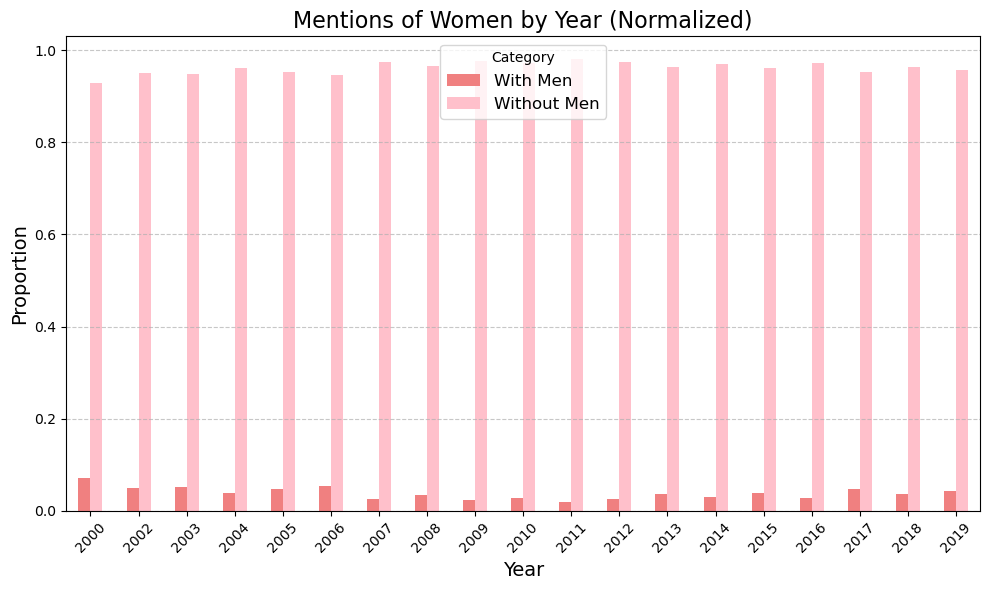

<Figure size 1000x600 with 0 Axes>

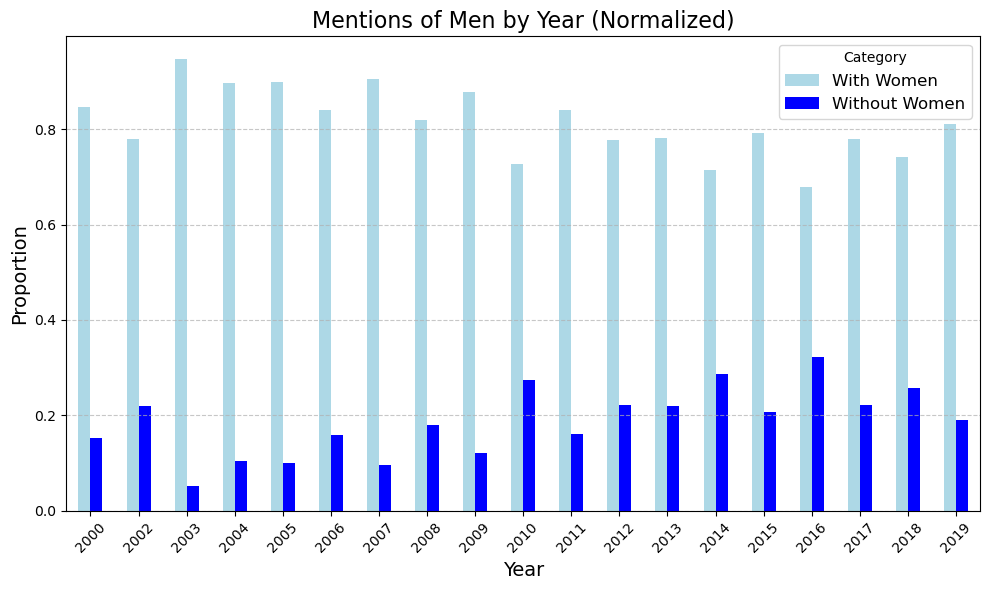

In [115]:
women_sentences_by_year = df_women_sentences.groupby('year').size()
women_sentences_only_by_year = df_women_sentences_only.groupby('year').size()
men_sentences_by_year = df_men_sentences.groupby('year').size()
men_sentences_only_by_year = df_men_sentences_only.groupby('year').size()

women_with_men_by_year = women_sentences_by_year - women_sentences_only_by_year
men_with_women_by_year = men_sentences_by_year - men_sentences_only_by_year

women_data = pd.DataFrame({
    'With Men': women_with_men_by_year,
    'Without Men': women_sentences_only_by_year
}).fillna(0)

men_data = pd.DataFrame({
    'With Women': men_with_women_by_year,
    'Without Women': men_sentences_only_by_year
}).fillna(0)

women_data_normalized = women_data.div(women_data.sum(axis=1), axis=0)
men_data_normalized = men_data.div(men_data.sum(axis=1), axis=0)

plt.figure(figsize=(10, 6))
women_data_normalized.plot(kind='bar', color=['lightcoral', 'pink'], figsize=(10, 6))
plt.title('Mentions of Women by Year (Normalized)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Proportion', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title="Category", fontsize=12)
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

plt.figure(figsize=(10, 6))
men_data_normalized.plot(kind='bar', color=['lightblue', 'blue'], figsize=(10, 6))
plt.title('Mentions of Men by Year (Normalized)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Proportion', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title="Category", fontsize=12)
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


<Figure size 1000x600 with 0 Axes>

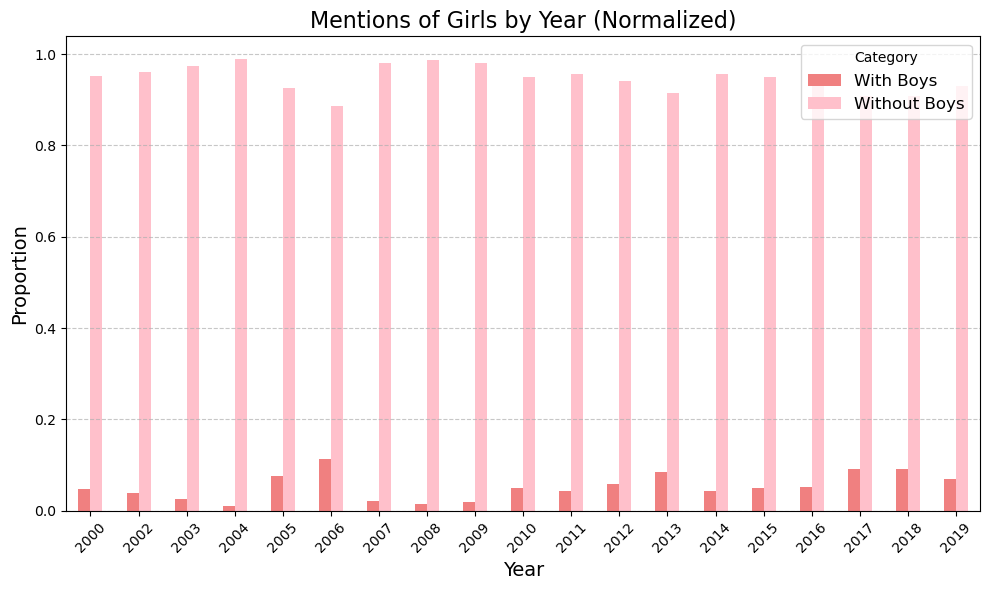

<Figure size 1000x600 with 0 Axes>

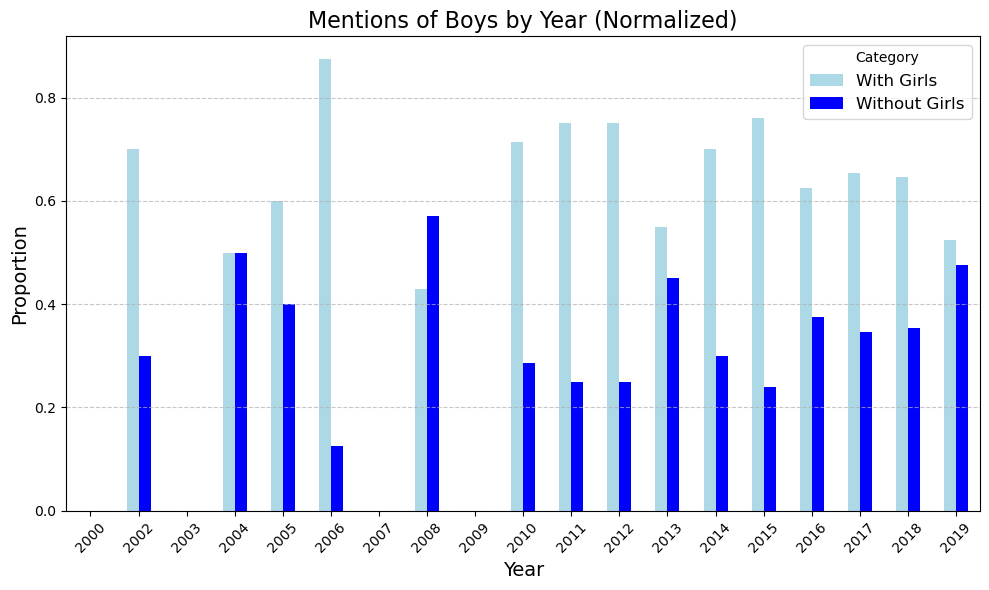

In [123]:
girls_sentences_by_year = df_girls_sentences.groupby('year').size()
girls_sentences_only_by_year = df_girls_sentences_only.groupby('year').size()
boys_sentences_by_year = df_boys_sentences.groupby('year').size()
boys_sentences_only_by_year = df_boys_sentences_only.groupby('year').size()

girls_with_boys_by_year = girls_sentences_by_year - girls_sentences_only_by_year
boys_with_girls_by_year = boys_sentences_by_year - boys_sentences_only_by_year

girls_data = pd.DataFrame({
    'With Boys': girls_with_boys_by_year,
    'Without Boys': girls_sentences_only_by_year
}).fillna(0)

boys_data = pd.DataFrame({
    'With Girls': boys_with_girls_by_year,
    'Without Girls': boys_sentences_only_by_year
}).fillna(0)

girls_data_normalized = girls_data.div(girls_data.sum(axis=1), axis=0)
boys_data_normalized = boys_data.div(boys_data.sum(axis=1), axis=0)

plt.figure(figsize=(10, 6))
girls_data_normalized.plot(kind='bar', color=['lightcoral', 'pink'], figsize=(10, 6))
plt.title('Mentions of Girls by Year (Normalized)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Proportion', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title="Category", fontsize=12)
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

plt.figure(figsize=(10, 6))
boys_data_normalized.plot(kind='bar', color=['lightblue', 'blue'], figsize=(10, 6))
plt.title('Mentions of Boys by Year (Normalized)', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Proportion', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title="Category", fontsize=12)
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [121]:
### TOPICS

In [25]:
topic_model_women = BERTopic(vectorizer_model=vectorizer_model)

## WOMEN ONLY
# get topics and probs
topics, probs = topic_model_women.fit_transform(df_women_girls_sentences_only)
topic_model_women.visualize_topics()

In [26]:
topic_model_women.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,11012,-1_womens_participation_processes_peace,"[womens, participation, processes, peace, nati...",[We welcome the call made today in the resolut...
1,0,1948,0_1325_2000_resolution_adoption,"[1325, 2000, resolution, adoption, implementat...","[Eleven years ago, the Security Council adopte..."
2,1,1556,1_victims_war_armed_vulnerable,"[victims, war, armed, vulnerable, suffer, viol...",[Women and children are often the first victim...
3,2,1072,2_council_councils_security_resolutions,"[council, councils, security, resolutions, man...",[The Security Council should fulfil its primar...
4,3,594,3_displaced_refugees_internally_refugee,"[displaced, refugees, internally, refugee, per...",[Women also constitute the majority of the wor...
...,...,...,...,...,...
306,305,10,305_rape_used_expelled_battleground,"[rape, used, expelled, battleground, drinking,...",[It is absolutely unacceptable in this day and...
307,306,10,306_reform_sector_2151_underscores,"[reform, sector, 2151, underscores, ssr, stage...",[Resolution 2151 (2014) on security sector ref...
308,307,10,307_kingdom_presidency_presiding_debate,"[kingdom, presidency, presiding, debate, deleg...",[ My delegation would like to thank the presid...
309,308,10,308_challenge_pressing_pose_promotion,"[challenge, pressing, pose, promotion, continu...",[The promotion and protection of the human rig...


In [27]:
# reduce topics (from 311 to 10)
topic_model_women.reduce_topics(df_women_girls_sentences_only, nr_topics=10)

In [28]:
topics = topic_model_women.topics_
topic_model_women.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,11012,-1_women_peace_womens_conflict,"[women, peace, womens, conflict, security, par...",[The importance of ensuring women's effective ...
1,0,18006,0_women_security_peace_resolution,"[women, security, peace, resolution, conflict,...",[The Security Council should strengthen its ow...
2,1,907,1_trafficking_girls_women_children,"[trafficking, girls, women, children, persons,...",[Azerbaijan is a party to the relevant interna...
3,2,89,2_friends_behalf_delivered_group,"[friends, behalf, delivered, group, statement,...",[Ireland aligns itself with the statement deli...
4,3,88,3_cent_agreements_signatories_peace,"[cent, agreements, signatories, peace, negotia...","[Between 1990 and 2017, women constituted just..."
5,4,61,4_condemns_violence_strongly_condemn,"[condemns, violence, strongly, condemn, sexual...",[China condemns all acts of violence against w...
6,5,47,5_climate_change_insecurity_impacts,"[climate, change, insecurity, impacts, implica...",[Unabated climate change risks increased viole...
7,6,40,6_arms_violence_treaty_trade,"[arms, violence, treaty, trade, convention, do...",[France calls for the full implementation of t...
8,7,23,7_blue_helmets_nurses_doctors,"[blue, helmets, nurses, doctors, balkans, offi...",[Pakistani women have served as police officer...
9,8,14,8_mary_robinson_lakes_region,"[mary, robinson, lakes, region, great, envoy, ...","[In June, when the Secretary-General's Special..."


In [29]:
topic_model_women.visualize_topics()

0


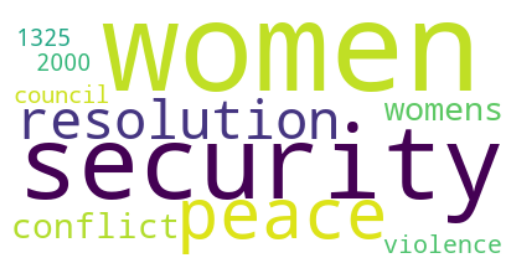

1


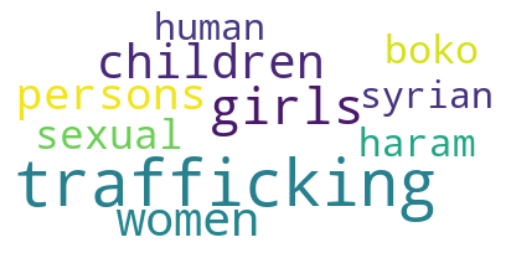

2


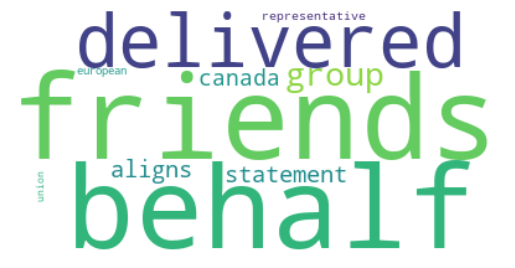

3


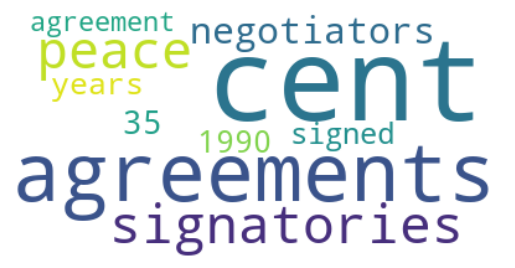

4


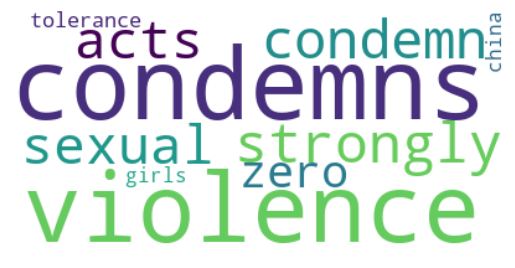

5


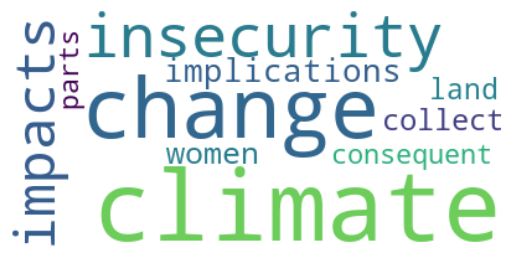

6


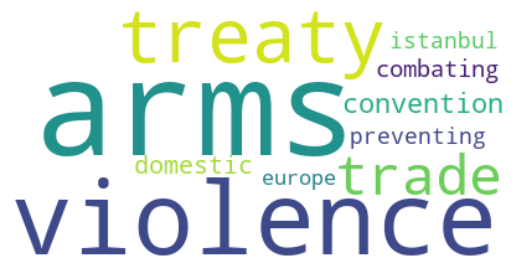

7


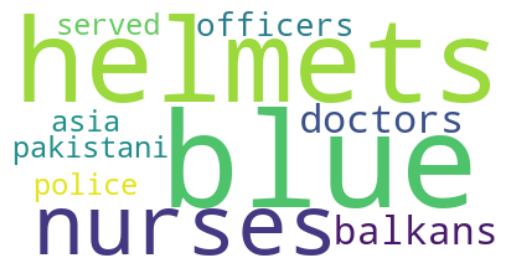

8


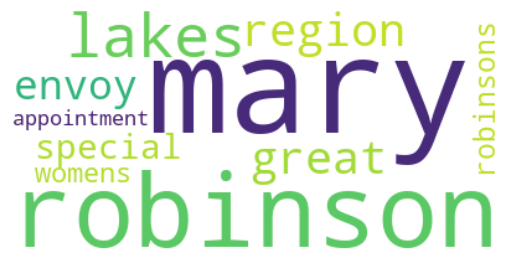

-1


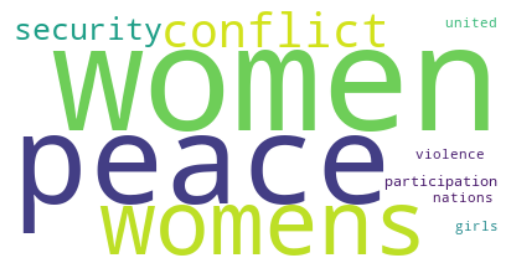

In [30]:
# Show wordcloud
for topic_n in set(topic_model_women.topics_):
    print(topic_n)
    create_wordcloud(topic_model_women, topic=topic_n)

In [41]:
topic_dfs = {}
docs = df_women_girls_sentences_only

for topic in set(topic_model_women.topics_):
    topic_docs = [doc for doc, t in zip(docs, topic_model_women.topics_) if t == topic]
    topic_dfs[f"topic_{topic}"] = pd.DataFrame({"Document": topic_docs, "Topic": topic})

In [45]:
topic_dfs["topic_5"]

,Document,Topic
0,"Tired of this, women pressed the Government to...",5
1,The women and young girls in the camps in Darf...,5
2,The physical and moral damage suffered by thos...,5
3,Continued insecurity also undermines the safet...,5
4,Insecurity is recurrent throughout the country...,5
5,Many women still suffer from a sense of insecu...,5
6,"Thus far, the effects of climate change are mo...",5
7,"As the Secretary-General's report indicates, i...",5
8,We have also consistently referred to the link...,5
9,We urge the international community to join ou...,5


In [46]:
topic_model = BERTopic(vectorizer_model=vectorizer_model)

## MEN ONLY
# get topics and probs
topics, probs = topic_model.fit_transform(df_men_boys_sentences_only)
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,82,-1_men_boys_violence_victims,"[men, boys, violence, victims, prevention, con...",[A stronger focus on prevention is also requir...
1,0,44,0_sexual_rape_boys_violence,"[sexual, rape, boys, violence, detention, chil...",[We also note with concern emerging trends suc...
2,1,42,1_men_cent_peace_united,"[men, cent, peace, united, nations, 97, peacek...","[However, we note with concern the data publis..."
3,2,36,2_violence_sexual_boys_men,"[violence, sexual, boys, men, sexually, stigma...",[It encourages support for children born of se...
4,3,27,3_gender_equality_role_men,"[gender, equality, role, men, boys, promotion,...","[Thirdly, it has not been mentioned by many pe..."
5,4,17,4_men_traditional_security_leaders,"[men, traditional, security, leaders, need, ri...",[We have to shed light on the important role t...
6,5,16,5_man_isis_house_beat,"[man, isis, house, beat, village, noora, marry...","[We are speaking about Noora, an 11-year-old f..."
7,6,12,6_man_said_saying_came,"[man, said, saying, came, leaders, business, h...",[I am not sure that it was he who said this bu...


In [47]:
topic_model.visualize_topics()

0


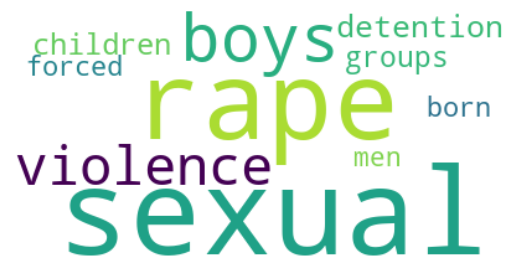

1


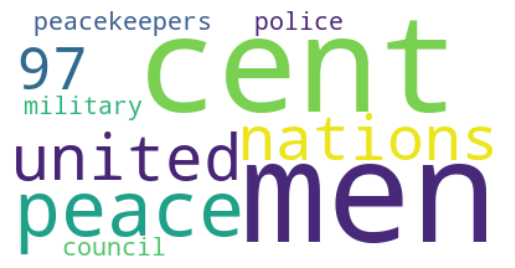

2


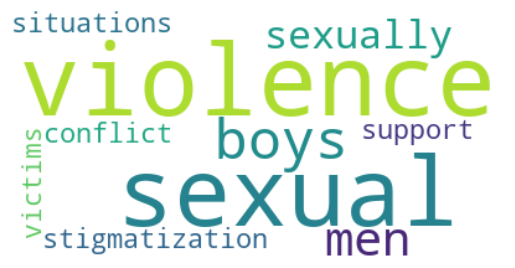

3


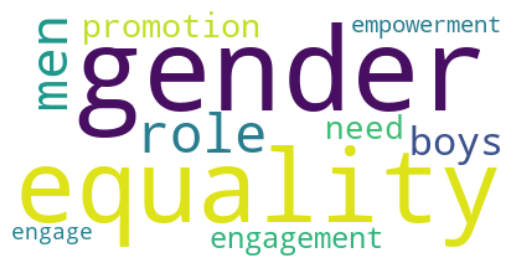

4


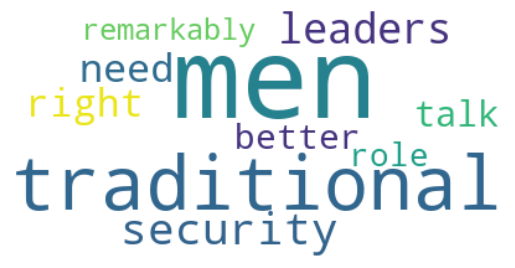

5


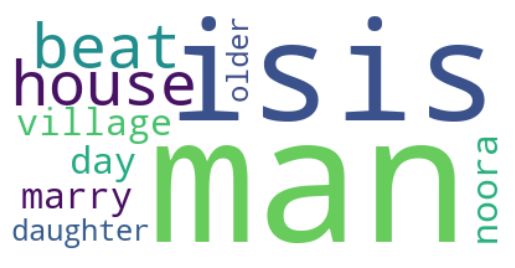

6


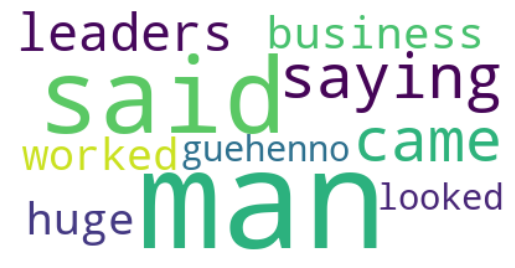

-1


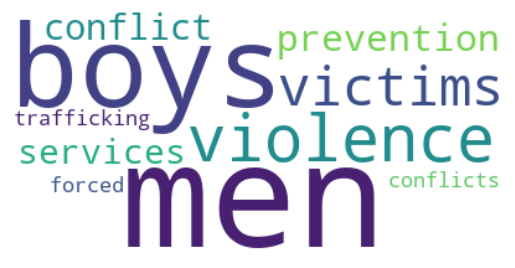

In [48]:
# Show wordcloud
for topic_n in set(topic_model.topics_):
    print(topic_n)
    create_wordcloud(topic_model, topic=topic_n)

In [49]:
docs = df_men_boys_sentences_only
topic_dfs = {}

for topic in set(topic_model.topics_):
    topic_docs = [doc for doc, t in zip(docs, topic_model.topics_) if t == topic]
    topic_dfs[f"topic_{topic}"] = pd.DataFrame({"Document": topic_docs, "Topic": topic})

In [51]:
topic_dfs["topic_1"]

,Document,Topic
0,"I thank the Council for those sentiments, but,...",1
1,"At the United Nations, including in this Counc...",1
2,"Furthermore, we should not assume that all com...",1
3,If I may talk of the good old days - if I may ...,1
4,Is it not incongruous that more than 50 years ...,1
5,"During the First World War, 80 per cent of tho...",1
6,Most senior posts in United Nations peacekeepi...,1
7,"Parties to the conflict are, by and large, men...",1
8,Too often they have been set aside while men b...,1
9,The history of men has long been the history ...,1


In [111]:
### women are much more talked about, with more variety
#